In [ ]:
from pathlib import Path
import sys

import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

sys.path.append("../")

from src.analytics.static_analysis import get_cluster_colors
from src.plots.boxplots import create_nse_boxplots
from src.plots.hex_maps import (
    hex_model_distribution_plots_n,
    hexes_plots_n,
)
from src.readers.geom_reader import load_geodata
from src.readers.hydro_series import load_metrics_from_directory
from src.timeseries_stats.metrics import evaluate_model
from src.utils.logger import setup_logger

plt.rcParams["font.family"] = "DeJavu Serif"
plt.rcParams["font.serif"] = ["Times New Roman"]

log = setup_logger("chapter_two", log_file="../logs/chapter_two.log")
# Base paths for optimization results
BASE_PATHS = {
    "GR4J": Path("../data/optimization/gr4j_simple"),
    "HBV": Path("../data/optimization/hbv_simple"),
    "RFR": Path("../data/optimization/rfr_simple"),
}

## Setup & Imports

## 1. Load Data

In [86]:
# Load watershed geometries and gauge locations
ws, gauges = load_geodata(folder_depth="../")
common_index = gauges.index.to_list()
basemap_data = gpd.read_file("../data/geometry/basemap_2023.gpkg")
# Load cluster assignments (from Chapter 1)
gauge_mapping = pd.read_csv(
    "../res/chapter_one/gauge_hybrid_mapping.csv",
    index_col="gauge_id",
    dtype={"gauge_id": str},
)

print(f"Loaded {len(gauges)} gauges with hybrid classification")

Loaded 996 gauges with hybrid classification


## 2. Load Model Results

In [23]:
# Load data for all models
model_data = {}
for model_name, base_path in BASE_PATHS.items():
    print(f"Loading {model_name} results from {base_path}...")
    model_data[model_name] = load_metrics_from_directory(base_path)
    print(f"  Found {len(model_data[model_name])} gauges")


Loading GR4J results from ../data/optimization/gr4j_simple...
  Found 996 gauges
Loading HBV results from ../data/optimization/hbv_simple...
  Found 996 gauges
Loading RFR results from ../data/optimization/rfr_simple...
  Found 996 gauges


In [28]:
# Examine structure of model_data
for model_name in model_data:
    print(f"\n{model_name}:")
    sample_gauge = next(iter(model_data[model_name]))
    print(f"  Sample gauge: {sample_gauge}")
    print(f"  Available datasets: {list(model_data[model_name][sample_gauge].keys())}")

    # Show structure of first dataset
    first_dataset = next(iter(model_data[model_name][sample_gauge]))
    print(f"  Structure of '{first_dataset}':")
    print(f"    Keys: {list(model_data[model_name][sample_gauge][first_dataset].keys())}")



GR4J:
  Sample gauge: 75257
  Available datasets: ['e5l', 'gpcp', 'e5', 'mswep']
  Structure of 'e5l':
    Keys: ['NSE', 'KGE', 'PBIAS', 'RMSE', 'MAE', 'logNSE', 'R2', 'r', 'PFE']

HBV:
  Sample gauge: 9166
  Available datasets: ['e5l', 'gpcp', 'e5', 'mswep']
  Structure of 'e5l':
    Keys: ['NSE', 'KGE', 'PBIAS', 'RMSE', 'MAE', 'logNSE', 'R2', 'r', 'PFE']

RFR:
  Sample gauge: 19185
  Available datasets: ['e5l', 'gpcp', 'e5', 'mswep']
  Structure of 'e5l':
    Keys: ['NSE', 'KGE', 'PBIAS', 'RMSE', 'MAE', 'logNSE', 'R2', 'r', 'PFE']


In [96]:
# Create separate dataframes for each model-dataset combination
dataset_dfs = {}

for model_name, model_dict in model_data.items():
    # Get available datasets from first gauge
    _sample_gauge = next(iter(model_dict))
    _datasets = list(model_dict[_sample_gauge].keys())

    for _dataset_name in _datasets:
        # Create dataframe for this model-dataset combination
        _rows = []

        for _gauge_id, _gauge_data in model_dict.items():
            if _dataset_name in _gauge_data:
                _metrics = _gauge_data[_dataset_name]
                _row = {"gauge_id": _gauge_id}
                _row.update(_metrics)
                _rows.append(_row)

        # Create dataframe
        _df_name = f"{model_name.lower()}_{_dataset_name}"
        _df = pd.DataFrame(_rows).set_index("gauge_id")

        # Reindex to common_index to ensure all gauges are present (fill missing with NaN)
        _df = _df.reindex(common_index)
        dataset_dfs[_df_name] = _df

        _missing_count = _df.isna().all(axis=1).sum()
        print(
            f"Created {_df_name}: {len(_df)} gauges × {len(_df.columns)} metrics "
            f"({_missing_count} missing)"
        )

print(f"\nTotal dataframes created: {len(dataset_dfs)}")
print(f"Available dataframes: {list(dataset_dfs.keys())}")


Created gr4j_e5l: 996 gauges × 9 metrics (2 missing)
Created gr4j_gpcp: 996 gauges × 9 metrics (1 missing)
Created gr4j_e5: 996 gauges × 9 metrics (0 missing)
Created gr4j_mswep: 996 gauges × 9 metrics (2 missing)
Created hbv_e5l: 996 gauges × 9 metrics (0 missing)
Created hbv_gpcp: 996 gauges × 9 metrics (0 missing)
Created hbv_e5: 996 gauges × 9 metrics (0 missing)
Created hbv_mswep: 996 gauges × 9 metrics (0 missing)
Created rfr_e5l: 996 gauges × 9 metrics (0 missing)
Created rfr_gpcp: 996 gauges × 9 metrics (0 missing)
Created rfr_e5: 996 gauges × 9 metrics (0 missing)
Created rfr_mswep: 996 gauges × 9 metrics (0 missing)

Total dataframes created: 12
Available dataframes: ['gr4j_e5l', 'gr4j_gpcp', 'gr4j_e5', 'gr4j_mswep', 'hbv_e5l', 'hbv_gpcp', 'hbv_e5', 'hbv_mswep', 'rfr_e5l', 'rfr_gpcp', 'rfr_e5', 'rfr_mswep']


In [97]:
# Create individual variables for easy access
gr4j_e5l = dataset_dfs["gr4j_e5l"]
gr4j_gpcp = dataset_dfs["gr4j_gpcp"]
gr4j_e5 = dataset_dfs["gr4j_e5"]
gr4j_mswep = dataset_dfs["gr4j_mswep"]

hbv_e5l = dataset_dfs["hbv_e5l"]
hbv_gpcp = dataset_dfs["hbv_gpcp"]
hbv_e5 = dataset_dfs["hbv_e5"]
hbv_mswep = dataset_dfs["hbv_mswep"]

rfr_e5l = dataset_dfs["rfr_e5l"]
rfr_gpcp = dataset_dfs["rfr_gpcp"]
rfr_e5 = dataset_dfs["rfr_e5"]
rfr_mswep = dataset_dfs["rfr_mswep"]

print("✓ Created individual dataframe variables:")
print("  GR4J: gr4j_e5l, gr4j_gpcp, gr4j_e5, gr4j_mswep")
print("  HBV:  hbv_e5l, hbv_gpcp, hbv_e5, hbv_mswep")
print("  RFR:  rfr_e5l, rfr_gpcp, rfr_e5, rfr_mswep")


✓ Created individual dataframe variables:
  GR4J: gr4j_e5l, gr4j_gpcp, gr4j_e5, gr4j_mswep
  HBV:  hbv_e5l, hbv_gpcp, hbv_e5, hbv_mswep
  RFR:  rfr_e5l, rfr_gpcp, rfr_e5, rfr_mswep


In [98]:
# Optional: Load additional LSTM variants if needed
lstm_single = pd.read_csv(
    "../data/optimization/lstm/Single_LSTM_table.csv",
    index_col="gauge_id",
    dtype={"gauge_id": str},
)
lstm_single = lstm_single.loc[common_index, :]
lstm_no_static = pd.read_csv(
    "../data/optimization/lstm/LSTM_no_static_res.csv",
    index_col="gauge_id",
    dtype={"gauge_id": str},
)
lstm_no_static = lstm_no_static.loc[common_index, :]


In [99]:
import pickle

lstm_pathes = {
    "gpcp": "../data/lstm_configs/model_runs/cudalstm_q_mm_day_gpcp_no_autocorr_static_1203_080402/test/model_epoch024/test_results.p",
    "e5": "../data/lstm_configs/model_runs/cudalstm_q_mm_day_era5_no_autocorr_static_1203_220232/test/model_epoch020/test_results.p",
    "e5l": "../data/lstm_configs/model_runs/cudalstm_q_mm_day_era5l_no_autocorr_static_1003_133332/test/model_epoch026/test_results.p",
    "mswep": "../data/lstm_configs/model_runs/cudalstm_q_mm_day_mswep_no_autocorr_static_1103_191754/test/model_epoch024/test_results.p",
    "ealstm": "../data/lstm_configs/model_runs/ealstm_q_mm_day_mswep_no_static_0205_144958/test/model_epoch038/test_results.p",
}
# Process LSTM pickle files and create dataframes with comprehensive metrics
lstm_dataset_dfs = {}

for _dataset_name, _pickle_path in lstm_pathes.items():
    print(f"Processing LSTM {_dataset_name}...")

    with open(_pickle_path, "rb") as _f:
        _lstm_data = pickle.load(_f)

    _rows = []
    _errors = 0

    for _gauge_id, _gauge_results in _lstm_data.items():
        if _gauge_id in common_index:
            try:
                # Extract observed and simulated data
                _xr_data = _gauge_results["1D"]["xr"]
                _obs = np.asarray(_xr_data["q_mm_day_obs"], dtype=float).flatten()
                _sim = np.asarray(_xr_data["q_mm_day_sim"], dtype=float).flatten()

                # Calculate comprehensive metrics
                _metrics = evaluate_model(observed=_obs, simulated=_sim)

                # Add gauge_id to metrics
                _metrics["gauge_id"] = _gauge_id
                _rows.append(_metrics)

            except Exception as _e:
                _errors += 1
                log.warning(
                    f"Error processing gauge {_gauge_id} for LSTM {_dataset_name}: {_e}"
                )
                continue
        else:
            continue

    # Create dataframe
    _df_name = f"lstm_{_dataset_name}"
    _df = pd.DataFrame(_rows).set_index("gauge_id")

    # Reindex to common_index to ensure all gauges are present (fill missing with NaN)
    _df = _df.reindex(common_index)
    lstm_dataset_dfs[_df_name] = _df

    _missing_count = _df.isna().all(axis=1).sum()
    print(
        f"  Created {_df_name}: {len(_df)} gauges × {len(_df.columns)} metrics "
        f"({_missing_count} missing)"
    )
    if _errors > 0:
        print(f"  ⚠ Skipped {_errors} gauges due to errors")

print(f"\n✓ Total LSTM dataframes created: {len(lstm_dataset_dfs)}")
print(f"Available LSTM dataframes: {list(lstm_dataset_dfs.keys())}")
# Create individual LSTM variables for easy access (matching the naming convention)
lstm_e5l = lstm_dataset_dfs["lstm_e5l"]
lstm_gpcp = lstm_dataset_dfs["lstm_gpcp"]
lstm_e5 = lstm_dataset_dfs["lstm_e5"]
lstm_mswep = lstm_dataset_dfs["lstm_mswep"]
ealstm_mswep = lstm_dataset_dfs["lstm_ealstm"]


Processing LSTM gpcp...
  Created lstm_gpcp: 996 gauges × 9 metrics
Processing LSTM e5...
  Created lstm_gpcp: 996 gauges × 9 metrics
Processing LSTM e5...
  Created lstm_e5: 996 gauges × 9 metrics
Processing LSTM e5l...
  Created lstm_e5: 996 gauges × 9 metrics
Processing LSTM e5l...
  Created lstm_e5l: 996 gauges × 9 metrics
Processing LSTM mswep...
  Created lstm_e5l: 996 gauges × 9 metrics
Processing LSTM mswep...
  Created lstm_mswep: 996 gauges × 9 metrics
Processing LSTM ealstm...
  Created lstm_mswep: 996 gauges × 9 metrics
Processing LSTM ealstm...
  Created lstm_ealstm: 996 gauges × 9 metrics

✓ Total LSTM dataframes created: 5
Available LSTM dataframes: ['lstm_gpcp', 'lstm_e5', 'lstm_e5l', 'lstm_mswep', 'lstm_ealstm']
  Created lstm_ealstm: 996 gauges × 9 metrics

✓ Total LSTM dataframes created: 5
Available LSTM dataframes: ['lstm_gpcp', 'lstm_e5', 'lstm_e5l', 'lstm_mswep', 'lstm_ealstm']


### HBV

In [100]:
gauges_nse = gauges.copy()
ws_nse = ws.copy()

gauges_nse["hbv_nse_e5l"] = hbv_e5l.loc[gauges_nse.index, "NSE"].clip(lower=0)
ws_nse["hbv_nse_e5l"] = hbv_e5l.loc[ws.index, "NSE"].clip(lower=0)
hbv_nse_e5l = gauges_nse["hbv_nse_e5l"].median()

gauges_nse["hbv_nse_e5"] = hbv_e5.loc[gauges_nse.index, "NSE"].clip(lower=0)
ws_nse["hbv_nse_e5"] = hbv_e5.loc[ws.index, "NSE"].clip(lower=0)
hbv_nse_e5 = gauges_nse["hbv_nse_e5"].median()

gauges_nse["hbv_nse_gpcp"] = hbv_gpcp.loc[gauges_nse.index, "NSE"].clip(lower=0)
ws_nse["hbv_nse_gpcp"] = hbv_gpcp.loc[ws.index, "NSE"].clip(lower=0)
hbv_nse_gpcp = gauges_nse["hbv_nse_gpcp"].median()

gauges_nse["hbv_nse_mswep"] = hbv_mswep.loc[gauges_nse.index, "NSE"].clip(lower=0)
ws_nse["hbv_nse_mswep"] = hbv_mswep.loc[ws.index, "NSE"].clip(lower=0)
hbv_nse_mswep = gauges_nse["hbv_nse_mswep"].median()


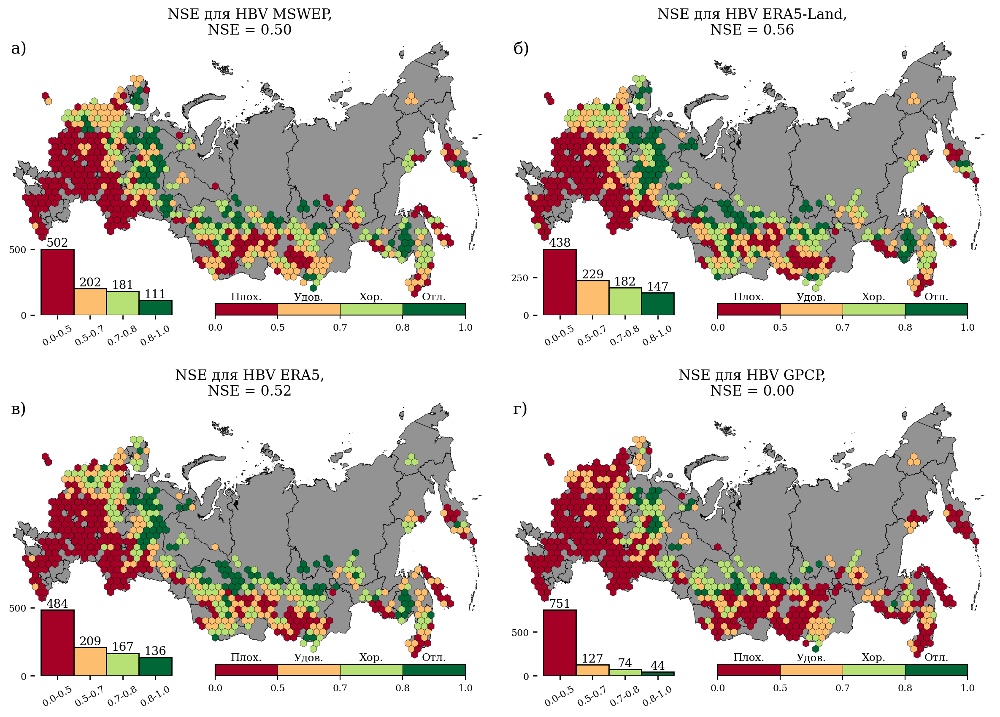

In [103]:
fig, hex_maps, radius_km, coverage_stats = hexes_plots_n(
    watersheds=ws_nse[
        ["geometry", "hbv_nse_mswep", "hbv_nse_e5l", "hbv_nse_e5", "hbv_nse_gpcp"]
    ],
    basemap_data=basemap_data,
    metric_cols=["hbv_nse_mswep", "hbv_nse_e5l", "hbv_nse_e5", "hbv_nse_gpcp"],
    label_list=["а)", "б)", "в)", "г)"],
    nrows=2,
    ncols=2,
    target_ws_per_hex=6.0,
    area_weighted=True,
    min_overlap_share=0.15,
    quantile=0.5,
    list_of_limits=[0.0, 0.5, 0.7, 0.8, 1.0],
    figsize=(15, 10),
    basemap_alpha=0.85,
    with_histogram=True,
    cb_label=["Плох.", "Удов.", "Хор.", "Отл."],
    title_text=[
        f"NSE для HBV MSWEP,\nNSE = {hbv_nse_mswep:.2f}",
        f"NSE для HBV ERA5-Land,\nNSE = {hbv_nse_e5l:.2f}",
        f"NSE для HBV ERA5,\nNSE = {hbv_nse_e5:.2f}",
        f"NSE для HBV GPCP,\nNSE = {hbv_nse_gpcp:.2f}",
    ],
)


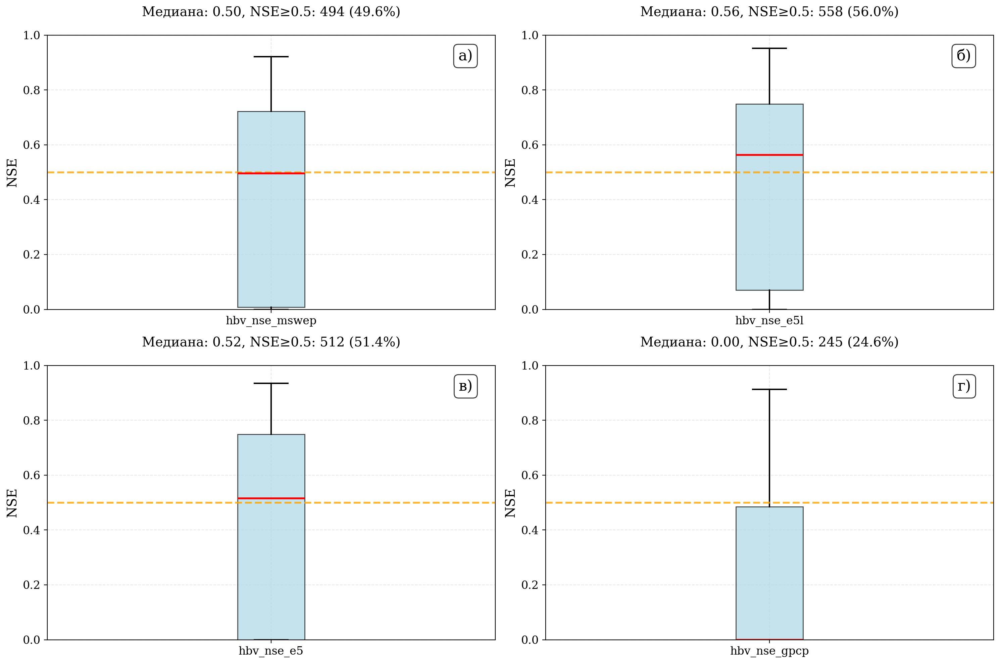

In [116]:
hbv_boxplots = create_nse_boxplots(
    df=gauges_nse,
    nse_columns=["hbv_nse_mswep", "hbv_nse_e5l", "hbv_nse_e5", "hbv_nse_gpcp"],
    figsize=(15, 10),
    max_cols=2,
)


### GR4J

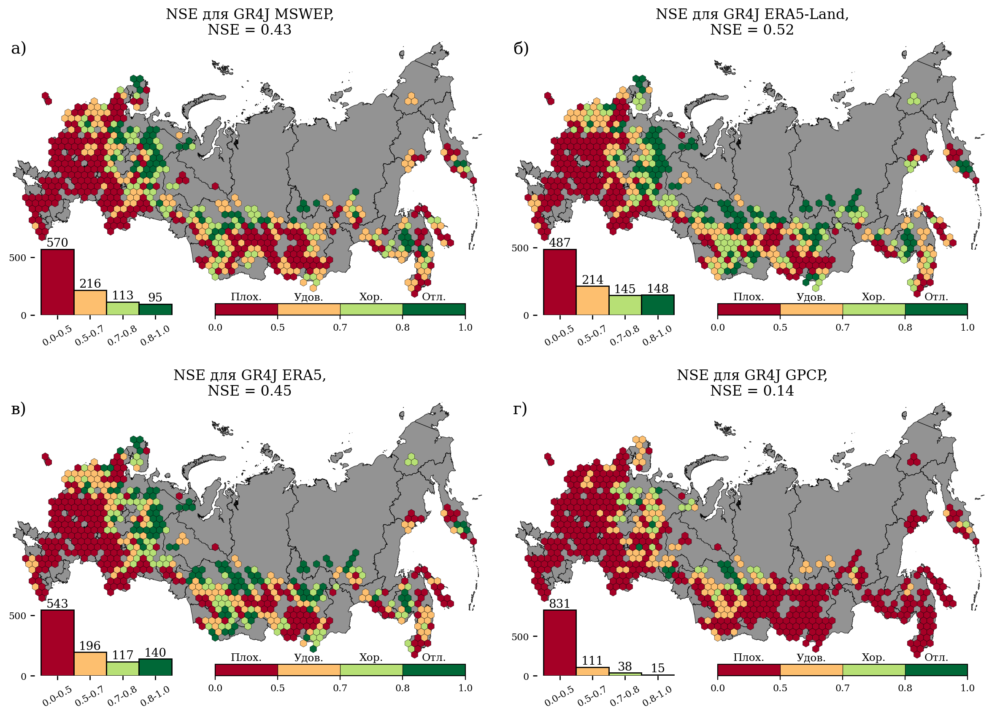

In [119]:
gauges_nse["gr4j_nse_e5l"] = gr4j_e5l.loc[gauges_nse.index, "NSE"]
ws_nse["gr4j_nse_e5l"] = gr4j_e5l.loc[ws.index, "NSE"].clip(lower=0)
gr4j_nse_e5l = gauges_nse["gr4j_nse_e5l"].median()

gauges_nse["gr4j_nse_e5"] = gr4j_e5.loc[gauges_nse.index, "NSE"]
ws_nse["gr4j_nse_e5"] = gr4j_e5.loc[ws.index, "NSE"].clip(lower=0)
gr4j_nse_e5 = gauges_nse["gr4j_nse_e5"].median()

gauges_nse["gr4j_nse_gpcp"] = gr4j_gpcp.loc[gauges_nse.index, "NSE"]
ws_nse["gr4j_nse_gpcp"] = gr4j_gpcp.loc[ws.index, "NSE"].clip(lower=0)
gr4j_nse_gpcp = gauges_nse["gr4j_nse_gpcp"].median()

gauges_nse["gr4j_nse_mswep"] = gr4j_mswep.loc[gauges_nse.index, "NSE"]
ws_nse["gr4j_nse_mswep"] = gr4j_mswep.loc[ws.index, "NSE"].clip(lower=0)
gr4j_nse_mswep = gauges_nse["gr4j_nse_mswep"].median()

fig, hex_maps, radius_km, coverage_stats = hexes_plots_n(
    watersheds=ws_nse[
        ["geometry", "gr4j_nse_mswep", "gr4j_nse_e5l", "gr4j_nse_e5", "gr4j_nse_gpcp"]
    ],
    basemap_data=basemap_data,
    metric_cols=["gr4j_nse_mswep", "gr4j_nse_e5l", "gr4j_nse_e5", "gr4j_nse_gpcp"],
    label_list=["а)", "б)", "в)", "г)"],
    nrows=2,
    ncols=2,
    target_ws_per_hex=6.0,
    area_weighted=True,
    min_overlap_share=0.15,
    quantile=0.5,
    list_of_limits=[0.0, 0.5, 0.7, 0.8, 1.0],
    figsize=(15, 10),
    basemap_alpha=0.85,
    with_histogram=True,
    cb_label=["Плох.", "Удов.", "Хор.", "Отл."],
    title_text=[
        f"NSE для GR4J MSWEP,\nNSE = {gr4j_nse_mswep:.2f}",
        f"NSE для GR4J ERA5-Land,\nNSE = {gr4j_nse_e5l:.2f}",
        f"NSE для GR4J ERA5,\nNSE = {gr4j_nse_e5:.2f}",
        f"NSE для GR4J GPCP,\nNSE = {gr4j_nse_gpcp:.2f}",
    ],
)


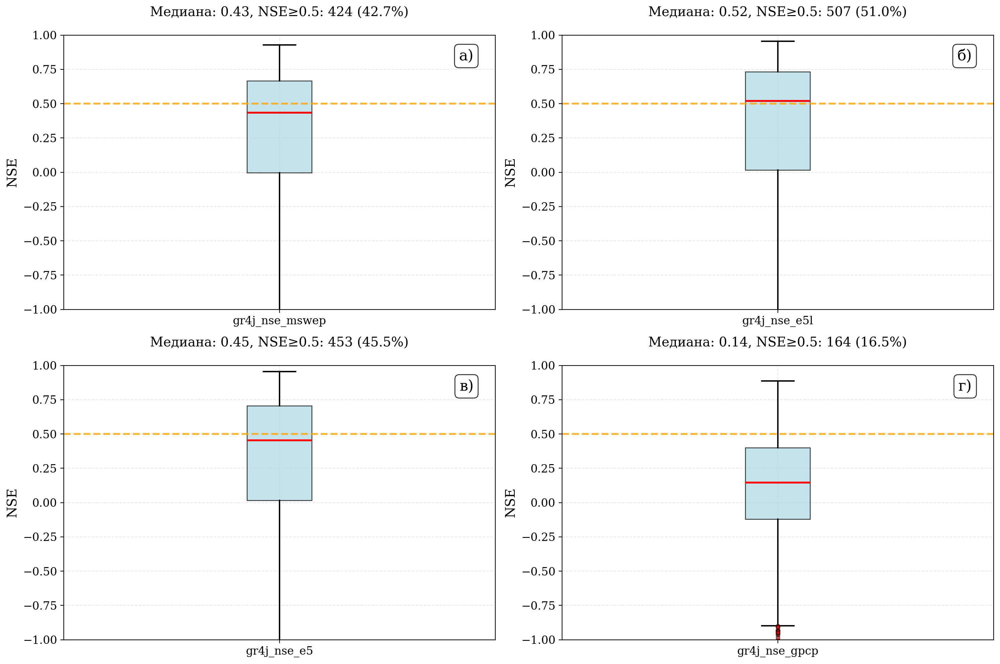

In [122]:
gr4j_boxplots = create_nse_boxplots(
    df=gauges_nse,
    nse_columns=["gr4j_nse_mswep", "gr4j_nse_e5l", "gr4j_nse_e5", "gr4j_nse_gpcp"],
    figsize=(15, 10),
    max_cols=2,
)


### RFR

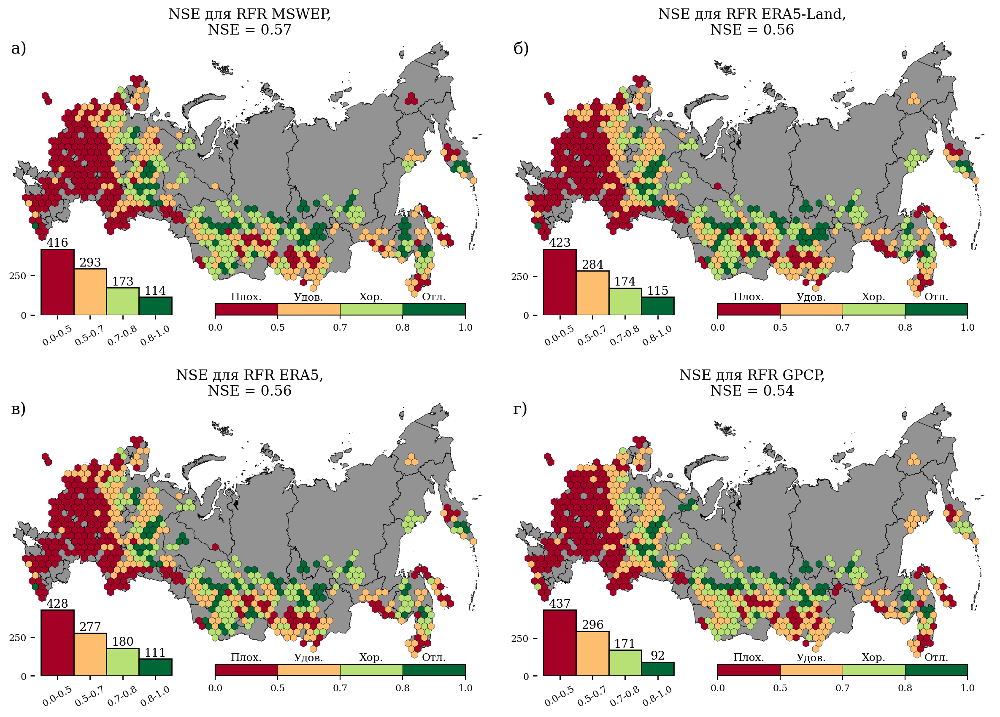

In [105]:
gauges_nse["rfr_nse_e5l"] = rfr_e5l.loc[gauges_nse.index, "NSE"]
ws_nse["rfr_nse_e5l"] = rfr_e5l.loc[ws.index, "NSE"].clip(lower=0)
rfr_nse_e5l = gauges_nse["rfr_nse_e5l"].median()

gauges_nse["rfr_nse_e5"] = rfr_e5.loc[gauges_nse.index, "NSE"]
ws_nse["rfr_nse_e5"] = rfr_e5.loc[ws.index, "NSE"].clip(lower=0)
rfr_nse_e5 = gauges_nse["rfr_nse_e5"].median()

gauges_nse["rfr_nse_gpcp"] = rfr_gpcp.loc[gauges_nse.index, "NSE"]
ws_nse["rfr_nse_gpcp"] = rfr_gpcp.loc[ws.index, "NSE"].clip(lower=0)
rfr_nse_gpcp = gauges_nse["rfr_nse_gpcp"].median()

gauges_nse["rfr_nse_mswep"] = rfr_mswep.loc[gauges_nse.index, "NSE"]
ws_nse["rfr_nse_mswep"] = rfr_mswep.loc[ws.index, "NSE"].clip(lower=0)
rfr_nse_mswep = gauges_nse["rfr_nse_mswep"].median()

fig, hex_maps, radius_km, coverage_stats = hexes_plots_n(
    watersheds=ws_nse[
        ["geometry", "rfr_nse_mswep", "rfr_nse_e5l", "rfr_nse_e5", "rfr_nse_gpcp"]
    ],
    basemap_data=basemap_data,
    metric_cols=["rfr_nse_mswep", "rfr_nse_e5l", "rfr_nse_e5", "rfr_nse_gpcp"],
    label_list=["а)", "б)", "в)", "г)"],
    nrows=2,
    ncols=2,
    target_ws_per_hex=6.0,
    area_weighted=True,
    min_overlap_share=0.15,
    quantile=0.5,
    list_of_limits=[0.0, 0.5, 0.7, 0.8, 1.0],
    figsize=(15, 10),
    basemap_alpha=0.85,
    with_histogram=True,
    cb_label=["Плох.", "Удов.", "Хор.", "Отл."],
    title_text=[
        f"NSE для RFR MSWEP,\nNSE = {rfr_nse_mswep:.2f}",
        f"NSE для RFR ERA5-Land,\nNSE = {rfr_nse_e5l:.2f}",
        f"NSE для RFR ERA5,\nNSE = {rfr_nse_e5:.2f}",
        f"NSE для RFR GPCP,\nNSE = {rfr_nse_gpcp:.2f}",
    ],
)


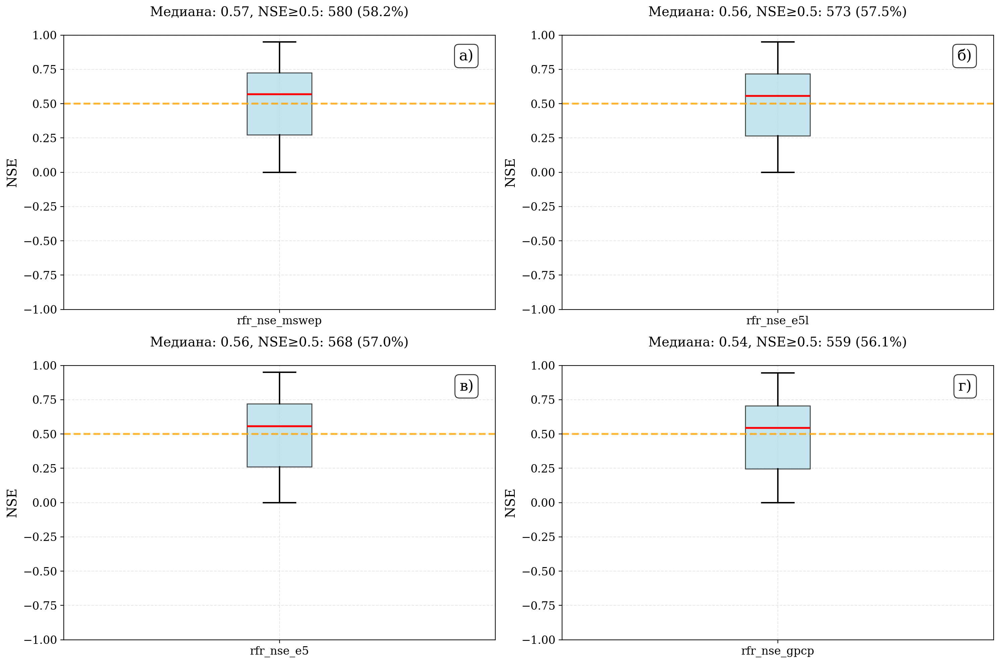

In [123]:
rfr_boxplots = create_nse_boxplots(
    df=gauges_nse,
    nse_columns=["rfr_nse_mswep", "rfr_nse_e5l", "rfr_nse_e5", "rfr_nse_gpcp"],
    figsize=(15, 10),
    max_cols=2,
)


### LSTM

In [125]:
gauges_nse["lstm_nse_e5l"] = lstm_e5l.loc[gauges_nse.index, "NSE"]
ws_nse["lstm_nse_e5l"] = lstm_e5l.loc[ws.index, "NSE"].clip(lower=0)
lstm_nse_e5l = gauges_nse["lstm_nse_e5l"].median()

gauges_nse["lstm_nse_e5"] = lstm_e5.loc[gauges_nse.index, "NSE"]
ws_nse["lstm_nse_e5"] = lstm_e5.loc[ws.index, "NSE"].clip(lower=0)
lstm_nse_e5 = gauges_nse["lstm_nse_e5"].median()

gauges_nse["lstm_nse_gpcp"] = lstm_gpcp.loc[gauges_nse.index, "NSE"]
ws_nse["lstm_nse_gpcp"] = lstm_gpcp.loc[ws.index, "NSE"].clip(lower=0)
lstm_nse_gpcp = gauges_nse["lstm_nse_gpcp"].median()

gauges_nse["lstm_nse_mswep"] = lstm_mswep.loc[gauges_nse.index, "NSE"]
ws_nse["lstm_nse_mswep"] = lstm_mswep.loc[ws.index, "NSE"].clip(lower=0)
lstm_nse_mswep = gauges_nse["lstm_nse_mswep"].median()


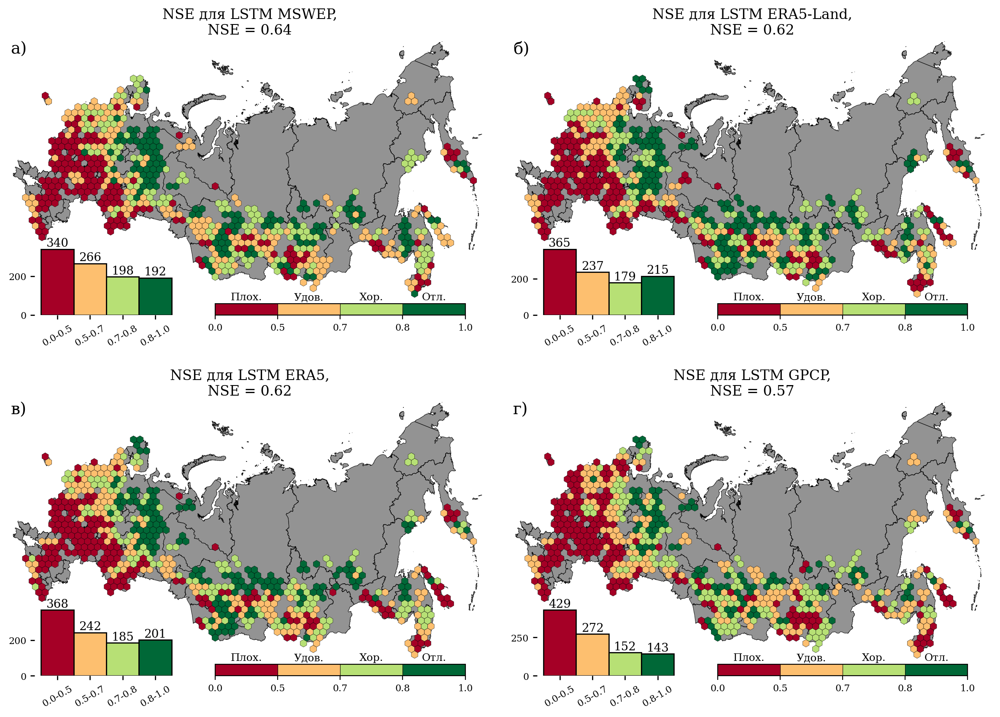

In [107]:
fig, hex_maps, radius_km, coverage_stats = hexes_plots_n(
    watersheds=ws_nse[
        ["geometry", "lstm_nse_mswep", "lstm_nse_e5l", "lstm_nse_e5", "lstm_nse_gpcp"]
    ],
    basemap_data=basemap_data,
    metric_cols=["lstm_nse_mswep", "lstm_nse_e5l", "lstm_nse_e5", "lstm_nse_gpcp"],
    label_list=["а)", "б)", "в)", "г)"],
    nrows=2,
    ncols=2,
    target_ws_per_hex=6.0,
    area_weighted=True,
    min_overlap_share=0.15,
    quantile=0.5,
    list_of_limits=[0.0, 0.5, 0.7, 0.8, 1.0],
    figsize=(15, 10),
    basemap_alpha=0.85,
    with_histogram=True,
    cb_label=["Плох.", "Удов.", "Хор.", "Отл."],
    title_text=[
        f"NSE для LSTM MSWEP,\nNSE = {lstm_nse_mswep:.2f}",
        f"NSE для LSTM ERA5-Land,\nNSE = {lstm_nse_e5l:.2f}",
        f"NSE для LSTM ERA5,\nNSE = {lstm_nse_e5:.2f}",
        f"NSE для LSTM GPCP,\nNSE = {lstm_nse_gpcp:.2f}",
    ],
)


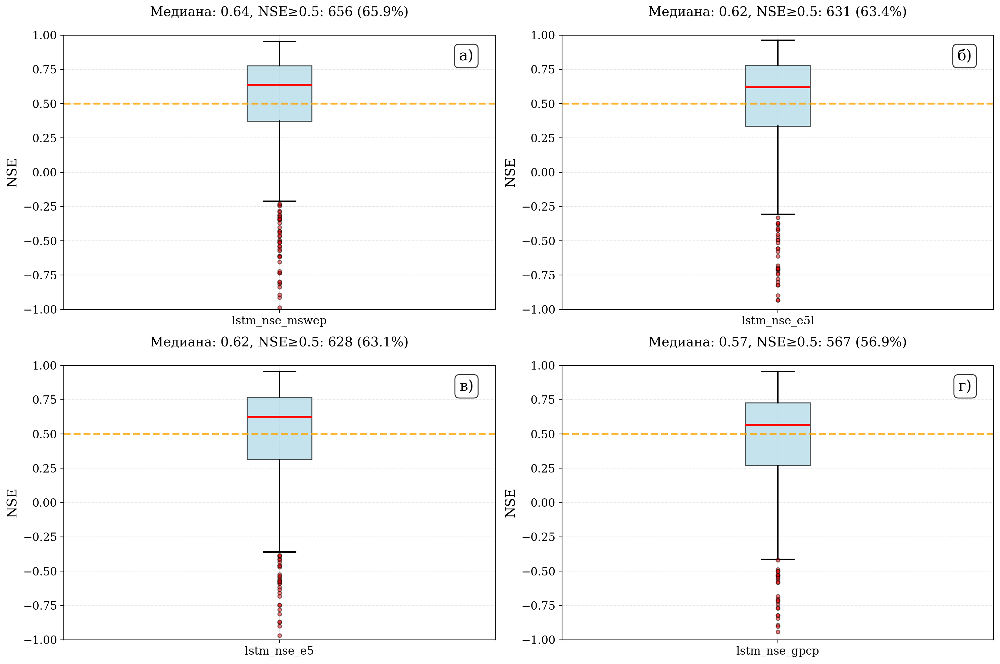

In [126]:
lstm_boxplots = create_nse_boxplots(
    df=gauges_nse,
    nse_columns=["lstm_nse_mswep", "lstm_nse_e5l", "lstm_nse_e5", "lstm_nse_gpcp"],
    figsize=(15, 10),
    max_cols=2,
)


In [128]:
lstm_single

,NSE,KGE,r,alpha,beta,RMSE,delta
gauge_id,,,,,,,
70158,0.255112,-0.891988,0.555636,2.832969,1.149604,0.961498,-35.697075
8290,0.378174,0.583122,0.759100,0.898267,0.675338,0.222718,-194.805590
70583,0.200950,-0.378012,0.539272,2.093664,1.700389,1.429975,-84.533394
76408,0.008584,-1.050328,0.239733,2.881811,1.290903,0.729104,-18.181456
72668,0.282443,0.087665,0.535365,1.784206,0.961402,0.478381,-32.869583
...,...,...,...,...,...,...,...
10584,-0.113955,0.419414,0.515716,0.951921,0.683397,0.399718,-251.465970
72577,0.311215,-0.590721,0.604457,2.537490,1.100309,0.594741,-48.455050
8347,0.308333,0.210098,0.557548,1.653909,1.024192,0.348672,-40.181007


In [129]:
gauges_nse["lstm_nse_no_static"] = lstm_no_static.loc[gauges_nse.index, "NSE"]
ws_nse["lstm_nse_no_static"] = lstm_no_static.loc[ws.index, "NSE"].clip(lower=0)
lstm_nse_no_static = gauges_nse["lstm_nse_no_static"].median()

gauges_nse["lstm_nse_single"] = lstm_single.loc[gauges_nse.index, "NSE"]
ws_nse["lstm_nse_single"] = lstm_single.loc[ws.index, "NSE"].clip(lower=0)
lstm_nse_single = gauges_nse["lstm_nse_single"].median()


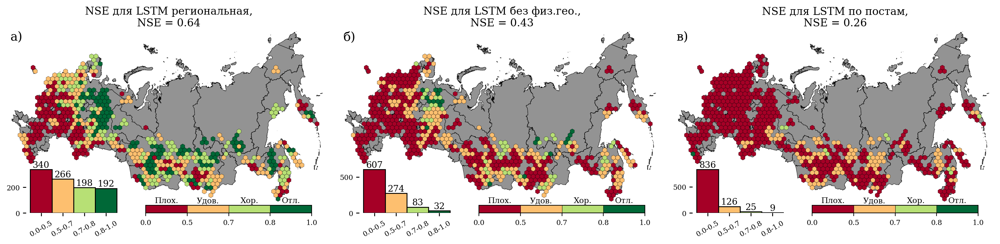

In [131]:
fig, hex_maps, radius_km, coverage_stats = hexes_plots_n(
    watersheds=ws_nse[
        ["geometry", "lstm_nse_mswep", "lstm_nse_no_static", "lstm_nse_single"]
    ],
    basemap_data=basemap_data,
    metric_cols=[
        "lstm_nse_mswep",
        "lstm_nse_no_static",
        "lstm_nse_single",
    ],
    label_list=["а)", "б)", "в)", "г)"],
    nrows=1,
    ncols=3,
    target_ws_per_hex=6.0,
    area_weighted=True,
    min_overlap_share=0.15,
    quantile=0.5,
    list_of_limits=[0.0, 0.5, 0.7, 0.8, 1.0],
    figsize=(20, 10),
    basemap_alpha=0.85,
    with_histogram=True,
    cb_label=["Плох.", "Удов.", "Хор.", "Отл."],
    title_text=[
        f"NSE для LSTM региональная,\nNSE = {lstm_nse_mswep:.2f}",
        f"NSE для LSTM без физ.гео.,\nNSE = {lstm_nse_no_static:.2f}",
        f"NSE для LSTM по постам,\nNSE = {lstm_nse_single:.2f}",
    ],
)


### Ensemble Models

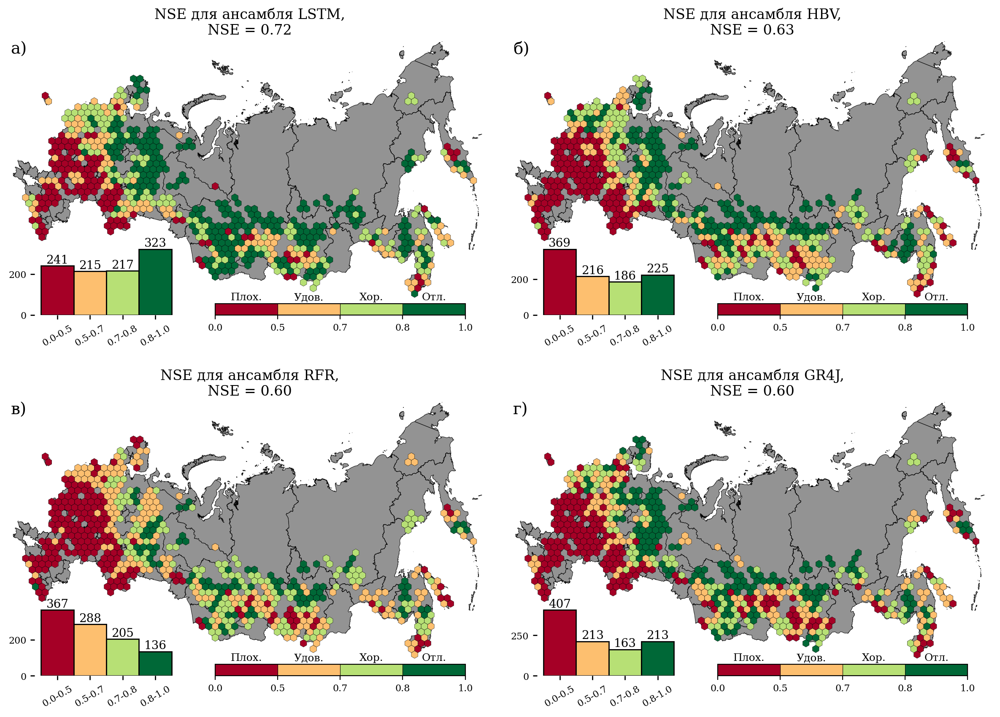

In [140]:
gauges_nse["Best GR4J NSE"] = gauges_nse[
    ["gr4j_nse_mswep", "gr4j_nse_e5l", "gr4j_nse_e5", "gr4j_nse_gpcp"]
].max(axis=1)
ws_nse["Best GR4J NSE"] = gauges_nse["Best GR4J NSE"].loc[ws.index]
best_gr4j_nse = gauges_nse["Best GR4J NSE"].median()

gauges_nse["Best HBV NSE"] = gauges_nse[
    ["hbv_nse_mswep", "hbv_nse_e5l", "hbv_nse_e5", "hbv_nse_gpcp"]
].max(axis=1)
ws_nse["Best HBV NSE"] = gauges_nse["Best HBV NSE"].loc[ws.index]
best_hbv_nse = gauges_nse["Best HBV NSE"].median()

gauges_nse["Best RFR NSE"] = gauges_nse[
    ["rfr_nse_mswep", "rfr_nse_e5l", "rfr_nse_e5", "rfr_nse_gpcp"]
].max(axis=1)
ws_nse["Best RFR NSE"] = gauges_nse["Best RFR NSE"].loc[ws.index]
best_rfr_nse = gauges_nse["Best RFR NSE"].median()

gauges_nse["Best LSTM NSE"] = gauges_nse[
    ["lstm_nse_mswep", "lstm_nse_e5l", "lstm_nse_e5", "lstm_nse_gpcp"]
].max(axis=1)
ws_nse["Best LSTM NSE"] = gauges_nse["Best LSTM NSE"].loc[ws.index]
best_lstm_nse = gauges_nse["Best LSTM NSE"].median()

gauges_nse["Best Models"] = gauges_nse[
    ["Best GR4J NSE", "Best HBV NSE", "Best RFR NSE", "Best LSTM NSE"]
].max(axis=1)
ws_nse["Best Models"] = gauges_nse["Best Models"].loc[ws.index]
best_models_nse = gauges_nse["Best Models"].median()

fig, hex_maps, radius_km, coverage_stats = hexes_plots_n(
    watersheds=ws_nse[
        ["geometry", "Best LSTM NSE", "Best HBV NSE", "Best RFR NSE", "Best GR4J NSE"]
    ],
    basemap_data=basemap_data,
    metric_cols=["Best LSTM NSE", "Best HBV NSE", "Best RFR NSE", "Best GR4J NSE"],
    label_list=["а)", "б)", "в)", "г)"],
    nrows=2,
    ncols=2,
    target_ws_per_hex=6.0,
    area_weighted=True,
    min_overlap_share=0.15,
    quantile=0.5,
    list_of_limits=[0.0, 0.5, 0.7, 0.8, 1.0],
    figsize=(15, 10),
    basemap_alpha=0.85,
    with_histogram=True,
    cb_label=["Плох.", "Удов.", "Хор.", "Отл."],
    title_text=[
        f"NSE для ансамбля LSTM,\nNSE = {best_lstm_nse:.2f}",
        f"NSE для ансамбля HBV,\nNSE = {best_hbv_nse:.2f}",
        f"NSE для ансамбля RFR,\nNSE = {best_rfr_nse:.2f}",
        f"NSE для ансамбля GR4J,\nNSE = {best_gr4j_nse:.2f}",
    ],
)


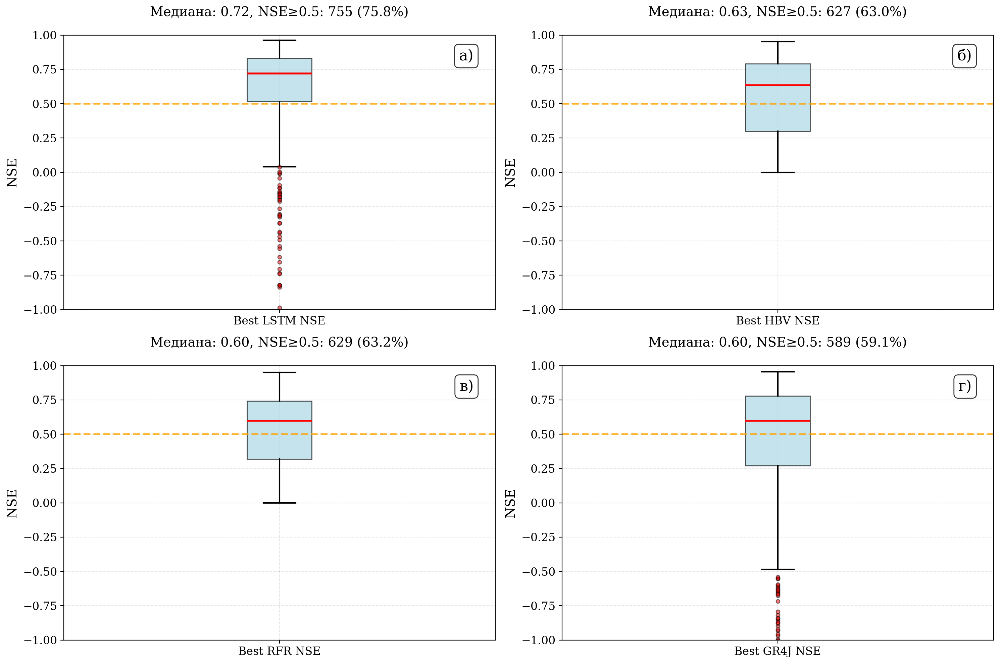

In [ ]:
ensemble_boxplots = create_nse_boxplots(
    df=gauges_nse,
    nse_columns=["Best LSTM NSE", "Best HBV NSE", "Best RFR NSE", "Best GR4J NSE"],
    figsize=(15, 10),
    max_cols=2,
)

### Meteo input for each type of model

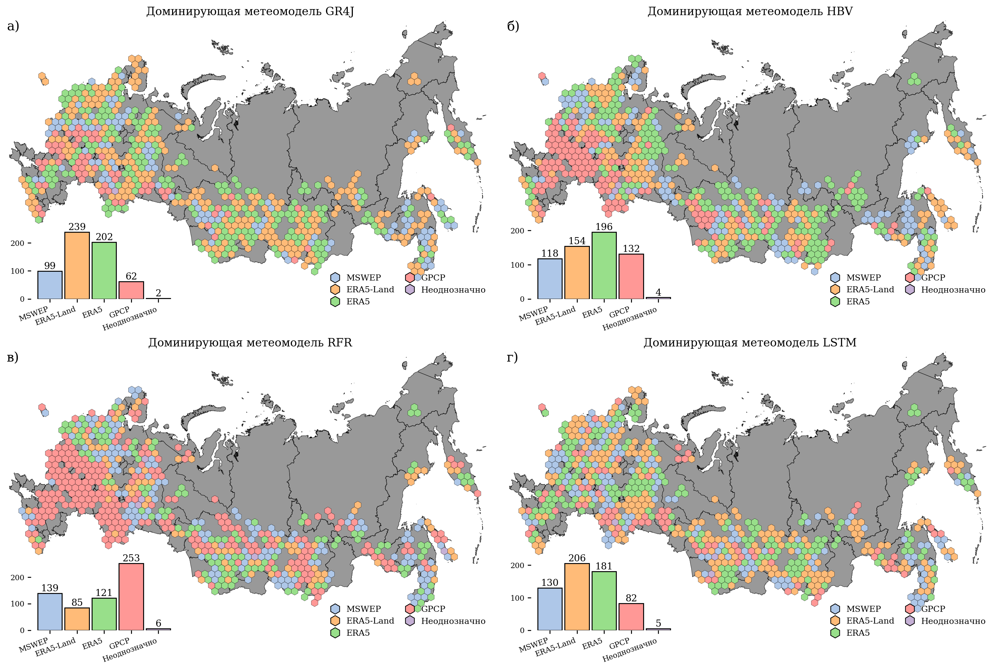

In [ ]:
import src.plots.hex_maps

# Prepare data for all 4 models
for _model_name in ["GR4J", "HBV", "RFR", "LSTM"]:
    _col_name = f"Лучшая метео модель {_model_name}"

    # Find best meteo model indices
    _mswep_idx = gauges_nse[
        gauges_nse[f"Best {_model_name} NSE"].isin(
            gauges_nse[f"{_model_name.lower()}_nse_mswep"]
        )
    ].index
    _era5_idx = gauges_nse[
        gauges_nse[f"Best {_model_name} NSE"].isin(
            gauges_nse[f"{_model_name.lower()}_nse_e5"]
        )
    ].index
    _era5l_idx = gauges_nse[
        gauges_nse[f"Best {_model_name} NSE"].isin(
            gauges_nse[f"{_model_name.lower()}_nse_e5l"]
        )
    ].index
    _gpcp_idx = gauges_nse[
        gauges_nse[f"Best {_model_name} NSE"].isin(
            gauges_nse[f"{_model_name.lower()}_nse_gpcp"]
        )
    ].index

    # Assign labels
    for _name, _idx in {
        "MSWEP": _mswep_idx,
        "ERA5": _era5_idx,
        "ERA5-Land": _era5l_idx,
        "GPCP": _gpcp_idx,
    }.items():
        gauges_nse.loc[_idx, _col_name] = _name

    # Copy to watersheds
    ws_nse.loc[common_index, [_col_name]] = gauges_nse.loc[:, [_col_name]]

# Define model dictionary and colors
model_dict = {
    "MSWEP": 1.0,
    "ERA5-Land": 2.0,
    "ERA5": 3.0,
    "GPCP": 4.0,
    "Неоднозначно": 5.0,
    np.nan: np.nan,
}

# Use secondary (softer) colors from cluster palette
_all_colors = get_cluster_colors(n_clusters=20)
_model_colors = _all_colors[15:20]  # Secondary palette (indices 15-19)

# Create multi-panel plot with histograms and per-subplot legends
fig, axes, hex_results, counts = hex_model_distribution_plots_n(
    watersheds=ws_nse,
    basemap_data=basemap_data,
    model_cols=[
        "Лучшая метео модель GR4J",
        "Лучшая метео модель HBV",
        "Лучшая метео модель RFR",
        "Лучшая метео модель LSTM",
    ],
    model_dict=model_dict,
    label_list=["а)", "б)", "в)", "г)"],
    nrows=2,
    ncols=2,
    min_overlap_share=0.15,
    dominant_threshold=0.33,
    target_ws_per_hex=6.0,
    color_list=_model_colors,
    figsize=(15, 10),
    with_histogram=True,
    histogram_rect=[0.05, 0.05, 0.30, 0.24],
    histogram_label_rotation=20,
    legend_show=True,
    legend_kwargs={"loc": "lower right", "bbox_to_anchor": (1.0, 0.0)},
    title_text=[
        "Доминирующая метеомодель GR4J",
        "Доминирующая метеомодель HBV",
        "Доминирующая метеомодель RFR",
        "Доминирующая метеомодель LSTM",
    ],
)

plt.show()

### Best Model Analysis

Определение лучшей модели для каждого водосбора и соответствующего метеоисточника

In [190]:
# Define best model columns for comparison
best_model_cols = {
    "GR4J": "Best GR4J NSE",
    "HBV": "Best HBV NSE",
    "RFR": "Best RFR NSE",
    "LSTM": "Best LSTM NSE",
}

# Find the best model for each gauge
gauges_nse["Лучшая модель"] = gauges_nse[list(best_model_cols.values())].idxmax(axis=1)

# Map to cleaner model names
_model_name_map = {
    "Best GR4J NSE": "GR4J",
    "Best HBV NSE": "HBV",
    "Best RFR NSE": "RFR",
    "Best LSTM NSE": "LSTM",
}
gauges_nse["Лучшая модель"] = gauges_nse["Лучшая модель"].map(_model_name_map)

# Copy to watersheds
ws_nse.loc[common_index, "Лучшая модель"] = gauges_nse.loc[:, "Лучшая модель"]

# Count best models distribution
best_model_counts = gauges_nse["Лучшая модель"].value_counts()

In [173]:
# For each gauge, find the best meteo source corresponding to the best model
# This requires checking which meteo source gave the best NSE for the winning model


def get_best_meteo_for_model(row: pd.Series) -> str:
    """Determine best meteo source for the best performing model."""
    _model = row["Лучшая модель"]

    if pd.isna(_model):
        return np.nan

    _model_lower = _model.lower()
    _meteo_cols = {
        "MSWEP": f"{_model_lower}_nse_mswep",
        "ERA5-Land": f"{_model_lower}_nse_e5l",
        "ERA5": f"{_model_lower}_nse_e5",
        "GPCP": f"{_model_lower}_nse_gpcp",
    }

    # Get NSE values for each meteo source
    _values = {}
    for _meteo_name, _col in _meteo_cols.items():
        if _col in row.index:
            _values[_meteo_name] = row[_col]

    if not _values:
        return np.nan

    # Find meteo with max NSE
    return max(_values, key=lambda x: _values[x] if pd.notna(_values[x]) else -np.inf)


gauges_nse["Лучший метеоисточник"] = gauges_nse.apply(get_best_meteo_for_model, axis=1)

# Copy to watersheds
ws_nse.loc[common_index, "Лучший метеоисточник"] = gauges_nse.loc[
    :, "Лучший метеоисточник"
]

# Count best meteo distribution
best_meteo_counts = gauges_nse["Лучший метеоисточник"].value_counts()
print("Распределение лучших метеоисточников (для лучших моделей):")
print(best_meteo_counts)

# Cross-tabulation: best model vs best meteo
cross_tab = pd.crosstab(
    gauges_nse["Лучшая модель"], gauges_nse["Лучший метеоисточник"], margins=True
)
print("\nКросс-таблица: Лучшая модель × Лучший метеоисточник:")
print(cross_tab)

Распределение лучших метеоисточников (для лучших моделей):
Лучший метеоисточник
MSWEP        365
ERA5-Land    290
ERA5         220
GPCP         121
Name: count, dtype: int64

Кросс-таблица: Лучшая модель × Лучший метеоисточник:
Лучший метеоисточник  ERA5  ERA5-Land  GPCP  MSWEP  All
Лучшая модель                                          
GR4J                    40         58     4     27  129
HBV                     43         62    10    120  235
LSTM                   114        146    75    171  506
RFR                     23         24    32     47  126
All                    220        290   121    365  996


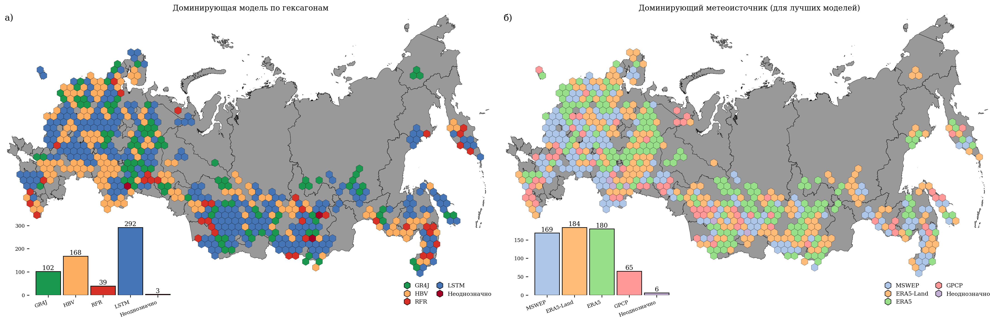


Статистика по гексагонам:
  Модели: {'GR4J': 102, 'HBV': 168, 'RFR': 39, 'LSTM': 292, 'Неоднозначно': 3}
  Метеоисточники: {'MSWEP': 169, 'ERA5-Land': 184, 'ERA5': 180, 'GPCP': 65, 'Неоднозначно': 6}


In [ ]:
# Reload module to get updated function with per-column dict support


importlib.reload(src.plots.hex_maps)
from src.plots.hex_maps import hex_model_distribution_plots_n

# Define dictionaries for each category type
model_type_dict = {
    "GR4J": 1.0,
    "HBV": 2.0,
    "RFR": 3.0,
    "LSTM": 4.0,
    "Неоднозначно": 5.0,
}

meteo_type_dict = {
    "MSWEP": 1.0,
    "ERA5-Land": 2.0,
    "ERA5": 3.0,
    "GPCP": 4.0,
    "Неоднозначно": 5.0,
}

# Get colors for each category type
_all_colors = get_cluster_colors(n_clusters=20)
_model_colors = _all_colors[10:15]
_meteo_colors = _all_colors[15:20]

# Side-by-side plot using updated hex_model_distribution_plots_n with per-column dicts
fig_combined, axes, hex_results, counts = hex_model_distribution_plots_n(
    watersheds=ws_nse,
    basemap_data=basemap_data,
    model_cols=["Лучшая модель", "Лучший метеоисточник"],
    model_dict=[model_type_dict, meteo_type_dict],  # List of dicts!
    label_list=["а)", "б)"],
    nrows=1,
    ncols=2,
    target_ws_per_hex=6.0,
    color_list=[_model_colors, _meteo_colors],  # List of color lists!
    figsize=(22, 9),
    with_histogram=True,
    histogram_rect=[0.05, 0.05, 0.30, 0.24],
    histogram_label_rotation=20,
    legend_show=True,
    legend_kwargs={"loc": "lower right", "bbox_to_anchor": (1.0, 0.0)},
    title_text=[
        "Доминирующая модель по гексагонам",
        "Доминирующий метеоисточник (для лучших моделей)",
    ],
)
plt.show()

print("\nСтатистика по гексагонам:")
print(f"  Модели: {counts['Лучшая модель'].to_dict()}")
print(f"  Метеоисточники: {counts['Лучший метеоисточник'].to_dict()}")

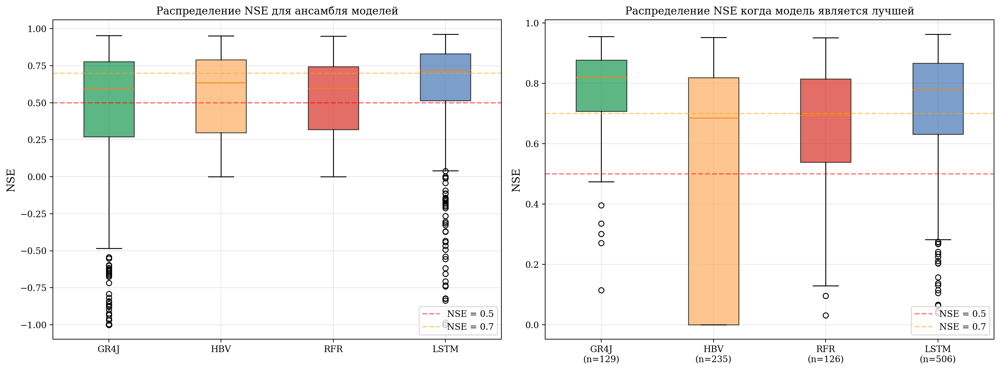

In [ ]:
# Create boxplot comparison of best NSE values by model type
fig_box, axes_box = plt.subplots(1, 2, figsize=(16, 6))

# Box 1: Best NSE for each model type (ensemble of meteo sources)
_ax1 = axes_box[0]
_box_data = [
    gauges_nse["Best GR4J NSE"].dropna().clip(lower=-1.0),
    gauges_nse["Best HBV NSE"].dropna().clip(lower=-1.0),
    gauges_nse["Best RFR NSE"].dropna().clip(lower=-1.0),
    gauges_nse["Best LSTM NSE"].dropna().clip(lower=-1.0),
]
_bp1 = _ax1.boxplot(
    _box_data, patch_artist=True, tick_labels=["GR4J", "HBV", "RFR", "LSTM"]
)
for _patch, _color in zip(_bp1["boxes"], _model_colors[:4]):
    _patch.set_facecolor(_color)
    _patch.set_alpha(0.7)
_ax1.set_ylabel("NSE", fontsize=12)
_ax1.set_title("Распределение NSE для ансамбля моделей", fontsize=12)
_ax1.axhline(y=0.5, color="red", linestyle="--", alpha=0.5, label="NSE = 0.5")
_ax1.axhline(y=0.7, color="orange", linestyle="--", alpha=0.5, label="NSE = 0.7")
_ax1.legend(loc="lower right")
_ax1.grid(True, alpha=0.3)

# Box 2: Best NSE when that model is THE best
_ax2 = axes_box[1]
_box_data_best = []
_labels_best = []
for _model in ["GR4J", "HBV", "RFR", "LSTM"]:
    _mask = gauges_nse["Лучшая модель"] == _model
    if _mask.sum() > 0:
        _box_data_best.append(gauges_nse.loc[_mask, f"Best {_model} NSE"].dropna())
        _labels_best.append(f"{_model}\n(n={_mask.sum()})")

_bp2 = _ax2.boxplot(_box_data_best, patch_artist=True, tick_labels=_labels_best)
for _patch, _color in zip(_bp2["boxes"], _model_colors[: len(_labels_best)]):
    _patch.set_facecolor(_color)
    _patch.set_alpha(0.7)
_ax2.set_ylabel("NSE", fontsize=12)
_ax2.set_title("Распределение NSE когда модель является лучшей", fontsize=12)
_ax2.axhline(y=0.5, color="red", linestyle="--", alpha=0.5, label="NSE = 0.5")
_ax2.axhline(y=0.7, color="orange", linestyle="--", alpha=0.5, label="NSE = 0.7")
_ax2.legend(loc="lower right")
_ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

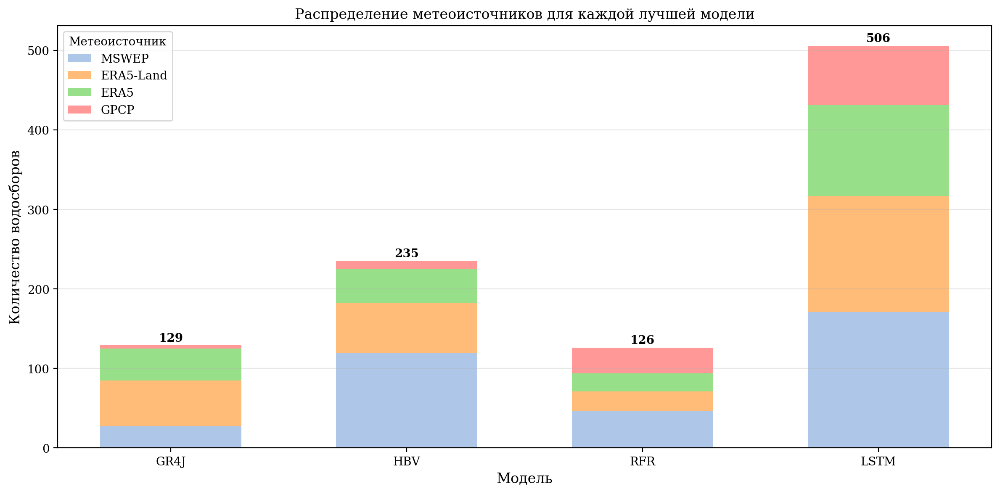

In [183]:
# Stacked bar chart: Model preference by meteo source
fig_stack, ax_stack = plt.subplots(figsize=(12, 6))

# Prepare data for stacked bar
_models = ["GR4J", "HBV", "RFR", "LSTM"]
_meteo_sources = ["MSWEP", "ERA5-Land", "ERA5", "GPCP"]

_stack_data = pd.DataFrame(index=_models, columns=_meteo_sources, dtype=float)
for _model in _models:
    for _meteo in _meteo_sources:
        _mask = (gauges_nse["Лучшая модель"] == _model) & (
            gauges_nse["Лучший метеоисточник"] == _meteo
        )
        _stack_data.loc[_model, _meteo] = _mask.sum()

# Create stacked bar chart
_bottom = np.zeros(len(_models))
_x = np.arange(len(_models))
_width = 0.6

for _i, _meteo in enumerate(_meteo_sources):
    _values = _stack_data[_meteo].values.astype(float)
    ax_stack.bar(
        _x, _values, _width, label=_meteo, bottom=_bottom, color=_meteo_colors[_i]
    )
    _bottom += _values

ax_stack.set_xlabel("Модель", fontsize=12)
ax_stack.set_ylabel("Количество водосборов", fontsize=12)
ax_stack.set_title("Распределение метеоисточников для каждой лучшей модели", fontsize=12)
ax_stack.set_xticks(_x)
ax_stack.set_xticklabels(_models)
ax_stack.legend(title="Метеоисточник", loc="upper left")
ax_stack.grid(True, alpha=0.3, axis="y")

# Add total counts on top of bars
for _i, _model in enumerate(_models):
    _total = _stack_data.loc[_model].sum()
    ax_stack.text(
        _i,
        _total + 2,
        f"{int(_total)}",
        ha="center",
        va="bottom",
        fontsize=10,
        fontweight="bold",
    )

plt.tight_layout()
plt.show()

In [ ]:
gauges_nse.to_file(
    "../res/chapter_two/tables/per_gauge_nse_results.geojson", driver="GeoJSON"
)